# Zadanie: wizualizacja

Poznaliśmy już pierwszy model dla regresji logistycznej, teraz sprawdź jak zachowuje się model dla różnych regularyzacji i ich stopnia. Zwizualizuj działanie modelu z wykorzystaniem funkcji plot_classification_surface oraz za każdym razem oblicz F1_score na zbiorze treningowym oraz testowym (zobaczysz czy model przypadkiem się nie przeucza).

### Wyjaśnienie kodu:

Przygotowanie parametrów:

- Testujemy różne siły regularyzacji (C = [0.001, ..., 1000])

- Trzy typy regularyzacji: L1, L2 i ElasticNet

- Dla ElasticNet testujemy różne proporcje (l1_ratio)

Trening i ewaluacja:

- Dla każdej kombinacji parametrów trenujemy model

- Obliczamy F1-score na zbiorze treningowym i testowym

- Generujemy wykresy powierzchni decyzyjnych

Wizualizacja:

- Dla każdego modelu pokazujemy powierzchnię decyzyjną na zbiorze treningowym i testowym

- Na końcu generujemy podsumowanie pokazujące jak F1-score zmienia się w zależności od siły regularyzacji

Analiza wyników:

- Identyfikujemy najlepszy model (najwyższy F1 na zbiorze testowym)

- Sprawdzamy czy nie ma przeuczenia (duża różnica między wynikami na train i test)

Interpretacja wyników:

- Małe wartości C (silna regularyzacja) powodują prostsze modele (możliwy niedouczenie)

- Duże wartości C (słaba regularyzacja) mogą prowadzić do przeuczenia

- ElasticNet (połączenie L1 i L2) często daje dobre wyniki

- Najlepszy model to ten z najlepszym F1 na zbiorze testowym

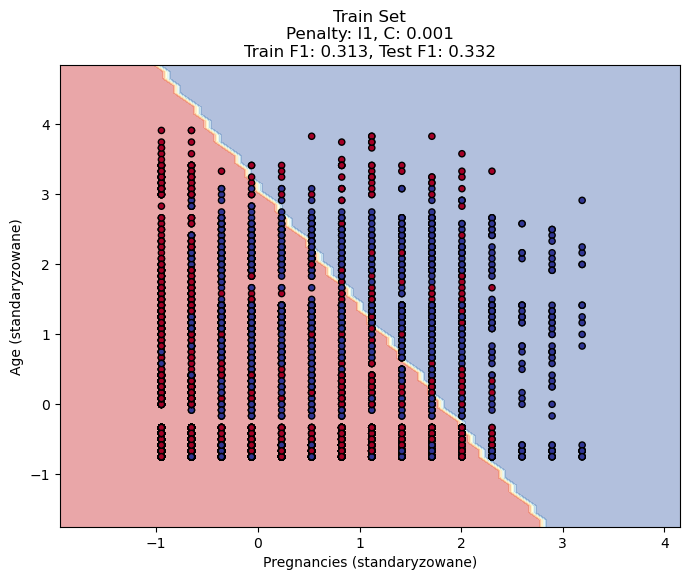

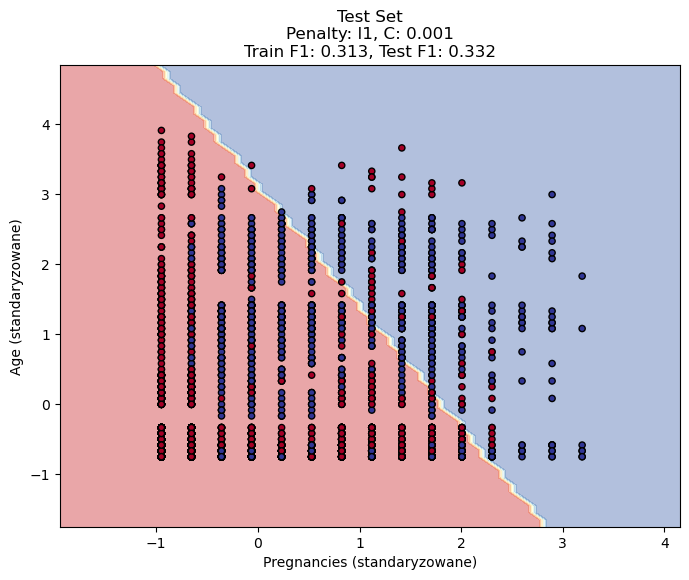

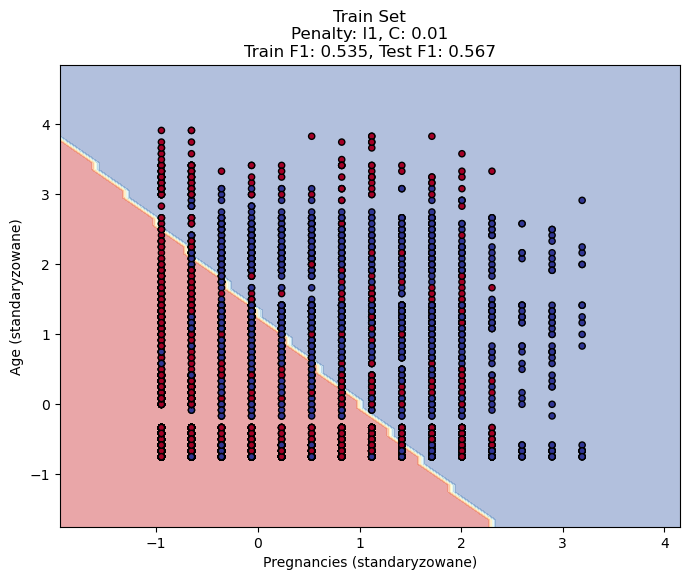

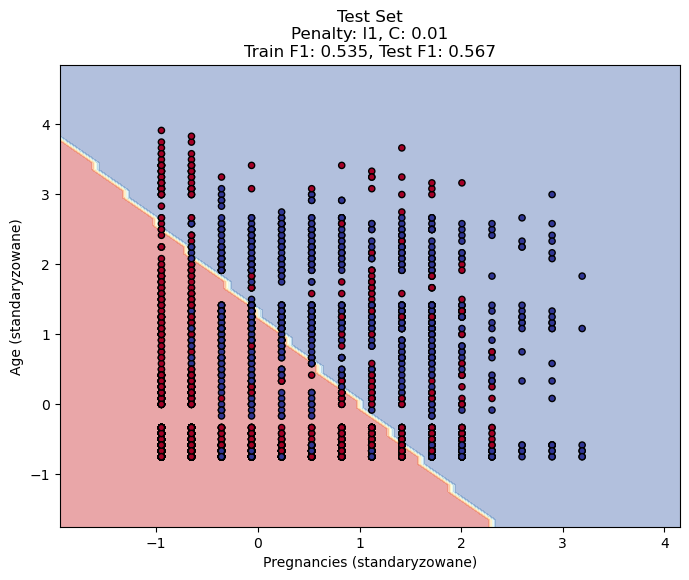

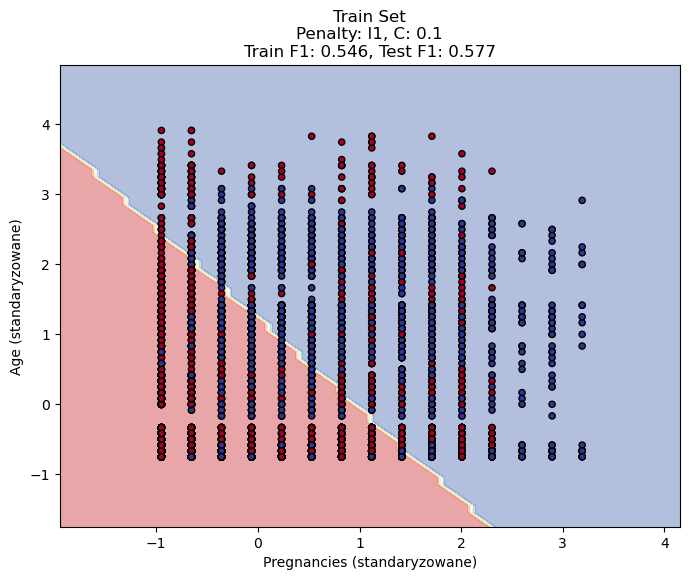

...

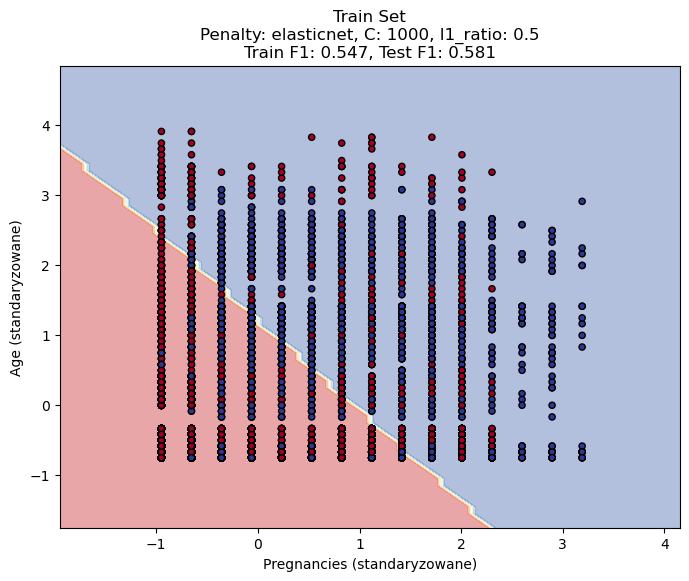

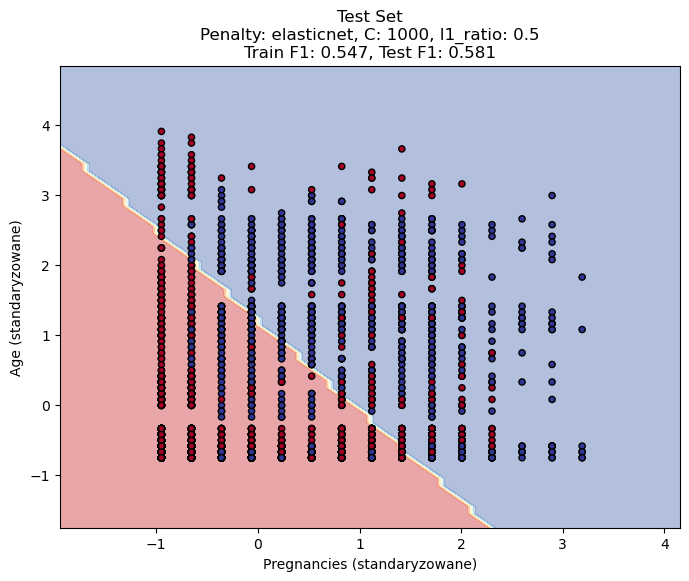

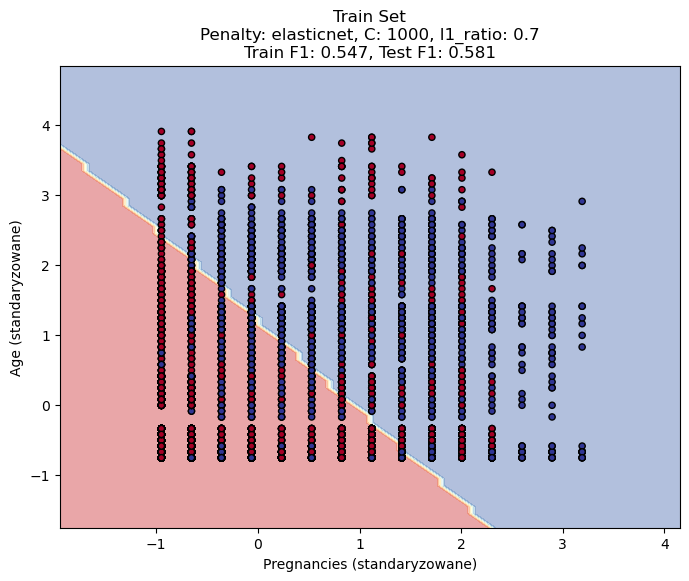

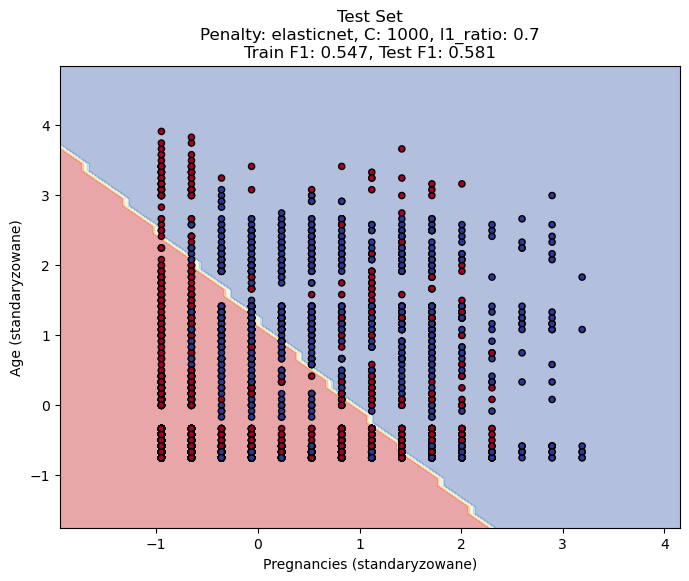

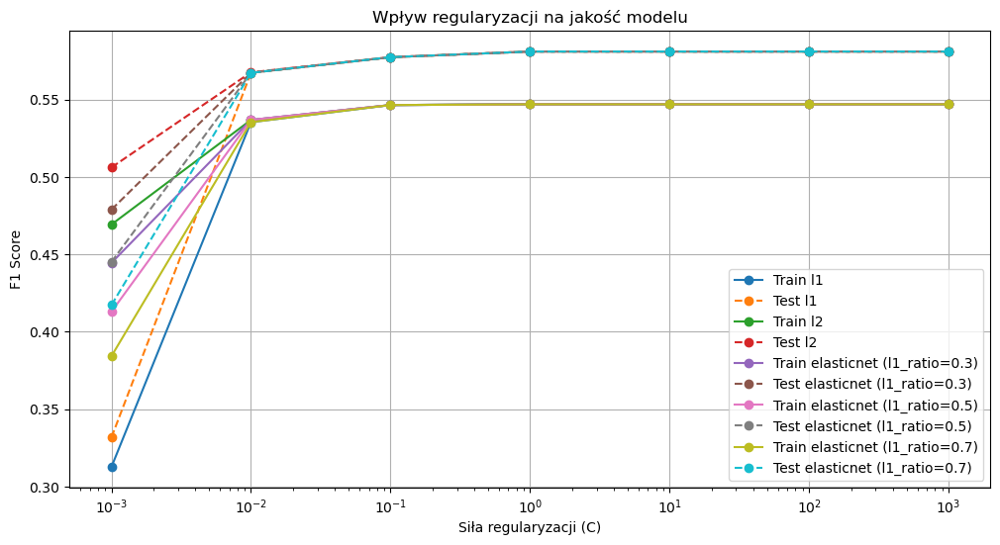


Najlepsze modele:
- Dla zbioru treningowego:
Penalty           l1
C                1.0
l1_ratio         NaN
Train_F1    0.546878
Test_F1     0.580928

- Dla zbioru testowego:
Penalty           l1
C                1.0
l1_ratio         NaN
Train_F1    0.546878
Test_F1     0.580928

Raport klasyfikacji dla najlepszego modelu:
              precision    recall  f1-score   support

           0       0.78      0.85      0.82      3000
           1       0.64      0.53      0.58      1500

    accuracy                           0.75      4500
   macro avg       0.71      0.69      0.70      4500
weighted avg       0.74      0.75      0.74      4500



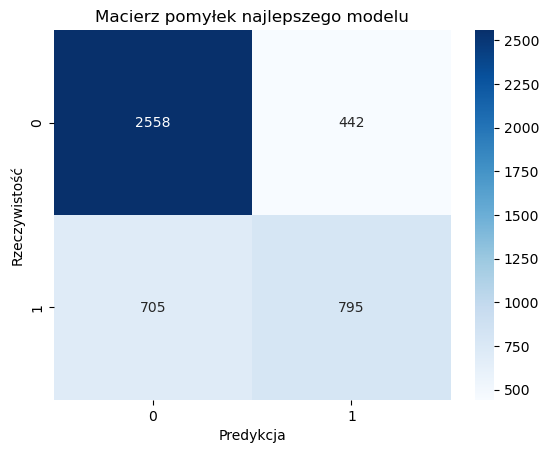

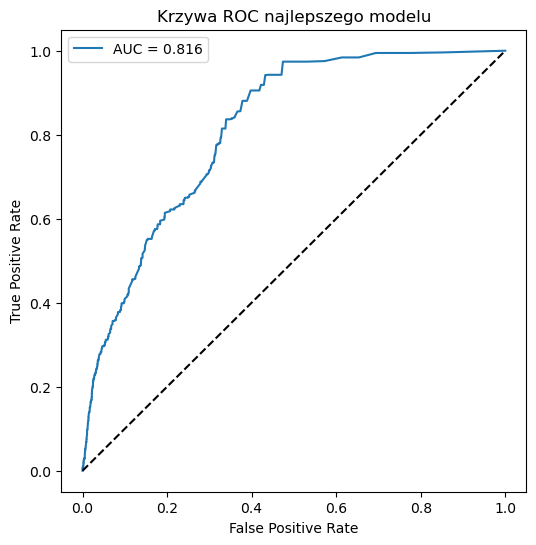

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (f1_score, confusion_matrix, 
                           classification_report, roc_curve, roc_auc_score)

# 1. Wczytanie danych
diabetes = pd.read_csv('diabetes.csv')
features = ['Pregnancies', 'Age']  # Wybieramy tylko te dwie cechy dla wizualizacji
target = 'Diabetic'
X, y = diabetes[features], diabetes[target]

# 2. Podział danych na zbiór treningowy i testowy
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=0, stratify=y
)

# 3. Standaryzacja danych
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

# 4. Funkcja do wizualizacji powierzchni decyzyjnej
def plot_decision_surface(X, y, model, title):
    plt.figure(figsize=(8, 6))
    
    # Granice wykresu
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1))
    
    # Predykcje dla siatki punktów
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # Wykres powierzchni decyzyjnej
    plt.contourf(xx, yy, Z, alpha=0.4, cmap='RdYlBu')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=20, edgecolor='k', cmap='RdYlBu')
    plt.title(title)
    plt.xlabel('Pregnancies (standaryzowane)')
    plt.ylabel('Age (standaryzowane)')
    plt.show()

# 5. Testowanie różnych parametrów regularyzacji
regularizations = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
penalties = ['l1', 'l2', 'elasticnet']

results = []

for penalty in penalties:
    for C in regularizations:
        # Dla elasticnet testujemy różne l1_ratio
        if penalty == 'elasticnet':
            l1_ratios = [0.3, 0.5, 0.7]
        else:
            l1_ratios = [None]  # Dla L1 i L2 ustawiamy None
            
        for l1_ratio in l1_ratios:
            # Konfiguracja modelu
            model_params = {
                'penalty': penalty,
                'C': C,
                'solver': 'saga',
                'max_iter': 10000
            }
            
            if penalty == 'elasticnet':
                model_params['l1_ratio'] = l1_ratio
            
            model = LogisticRegression(**model_params)
            
            # Trenowanie modelu i obliczenia metryk
            model.fit(X_train_std, y_train)
            train_f1 = f1_score(y_train, model.predict(X_train_std))
            test_f1 = f1_score(y_test, model.predict(X_test_std))
            
            # Zapisywanie wyników
            results.append({
                'Penalty': penalty,
                'C': C,
                'l1_ratio': l1_ratio,
                'Train_F1': train_f1,
                'Test_F1': test_f1
            })
            
            # Wizualizacja
            title = f'Penalty: {penalty}, C: {C}'
            if l1_ratio:
                title += f', l1_ratio: {l1_ratio}'
            title += f'\nTrain F1: {train_f1:.3f}, Test F1: {test_f1:.3f}'
            
            plot_decision_surface(X_train_std, y_train, model, 'Train Set\n' + title)
            plot_decision_surface(X_test_std, y_test, model, 'Test Set\n' + title)

# 6. Analiza wyników
results_df = pd.DataFrame(results)

# Wykres porównawczy
plt.figure(figsize=(12, 6))
for penalty in penalties:
    subset = results_df[results_df['Penalty'] == penalty]
    if penalty == 'elasticnet':
        for l1_ratio in l1_ratios:
            subsubset = subset[subset['l1_ratio'] == l1_ratio]
            plt.plot(subsubset['C'], subsubset['Train_F1'], 'o-', 
                    label=f'Train {penalty} (l1_ratio={l1_ratio})')
            plt.plot(subsubset['C'], subsubset['Test_F1'], 'o--',
                    label=f'Test {penalty} (l1_ratio={l1_ratio})')
    else:
        plt.plot(subset['C'], subset['Train_F1'], 'o-', label=f'Train {penalty}')
        plt.plot(subset['C'], subset['Test_F1'], 'o--', label=f'Test {penalty}')

plt.xscale('log')
plt.xlabel('Siła regularyzacji (C)')
plt.ylabel('F1 Score')
plt.title('Wpływ regularyzacji na jakość modelu')
plt.legend()
plt.grid()
plt.show()

# 7. Podsumowanie najlepszych modeli
print("\nNajlepsze modele:")
print("- Dla zbioru treningowego:")
print(results_df.loc[results_df['Train_F1'].idxmax()].to_string())
print("\n- Dla zbioru testowego:")
print(results_df.loc[results_df['Test_F1'].idxmax()].to_string())

# 8. Szczegółowa analiza najlepszego modelu (testowego)
best_model_params = results_df.loc[results_df['Test_F1'].idxmax()].copy()

# Upewniamy się, że l1_ratio jest None dla L1/L2
if best_model_params['Penalty'] != 'elasticnet':
    best_model_params['l1_ratio'] = None

best_model = LogisticRegression(
    penalty=best_model_params['Penalty'],
    C=best_model_params['C'],
    solver='saga',
    l1_ratio=best_model_params['l1_ratio'],
    max_iter=10000
).fit(X_train_std, y_train)

print("\nRaport klasyfikacji dla najlepszego modelu:")
print(classification_report(y_test, best_model.predict(X_test_std)))

# Macierz pomyłek
plt.figure()
cm = confusion_matrix(y_test, best_model.predict(X_test_std))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Macierz pomyłek najlepszego modelu')
plt.xlabel('Predykcja')
plt.ylabel('Rzeczywistość')
plt.show()

# Krzywa ROC
plt.figure(figsize=(6, 6))
fpr, tpr, _ = roc_curve(y_test, best_model.predict_proba(X_test_std)[:, 1])
plt.plot(fpr, tpr, label=f'AUC = {roc_auc_score(y_test, best_model.predict_proba(X_test_std)[:, 1]):.3f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Krzywa ROC najlepszego modelu')
plt.legend()
plt.show()